# Concours MTH3302

## Calepin de base (succinct)

In [152]:
using CSV
using MLJ
using DataFrames
using Gadfly
using Random
using Statistics
using Combinatorics

In [151]:
Random.seed!(4355)

TaskLocalRNG()

Chargement des données d'entrainement et à prédire.

In [131]:
train_data = CSV.read("train.csv", DataFrame, decimal=',')
test = CSV.read("test.csv", DataFrame, decimal=',');

first(train_data, 5)

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359


Data Exploration

In [132]:
describe(train_data)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,annee,2019.19,2014,2019.0,2024,0,Int64
2,type,,VUS_petit,,voiture_sous_compacte,0,String31
3,nombre_cylindres,5.28535,3,4.0,12,0,Int64
4,cylindree,2.90303,1.2,2.5,6.8,0,Float64
5,transmission,,4x4,,traction,0,String15
6,boite,,automatique,,manuelle,0,String15
7,consommation,10.3568,4.52327,10.2265,16.8007,0,Float64


Le type String15 pour les variables **type**, **transmission** et **boite** nous indique qu'il s'agit de variables catégorielles.
Il faudra donc les encoder en variables numériques. 

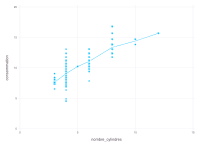

In [133]:
# analyser la consommation par nombre_cylindres
average_per_cylindres = combine(groupby(train_data, :nombre_cylindres), :consommation => mean)
plot(
    layer(train_data, x=:nombre_cylindres, y=:consommation, Geom.point),
    layer(average_per_cylindres, x=:nombre_cylindres, y=:consommation_mean, Geom.line),
    Guide.xlabel("nombre_cylindres"), Guide.ylabel("consommation")
)

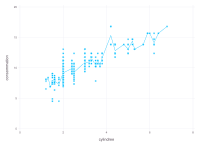

In [134]:
# analyser la consommation par cylindree
average_per_cylindree = combine(groupby(train_data, :cylindree), :consommation => mean)
plot(
    layer(train_data, x=:cylindree, y=:consommation, Geom.point),
    layer(average_per_cylindree, x=:cylindree, y=:consommation_mean, Geom.line),
    Guide.xlabel("cylindree"), Guide.ylabel("consommation")
)

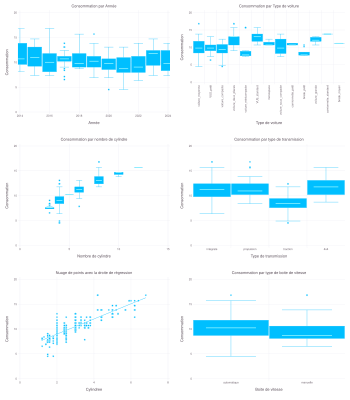

In [135]:
function box_plot_categorical(data)
    Gadfly.set_default_plot_size(35cm, 40cm)
    p1 = plot(data, x=:annee, y=:consommation, Geom.boxplot, Guide.title("Consommation par Année"), Guide.xlabel("Année"), Guide.ylabel("Consommation"))
    p2 = plot(data, x=:type, y=:consommation, Geom.boxplot, Guide.title("Consommation par Type de voiture"), Guide.xlabel("Type de voiture"), Guide.ylabel("Consommation"))
    p3 = plot(data, x=:nombre_cylindres, y=:consommation, Geom.boxplot, Guide.title("Consommation par nombre de cylindre"), Guide.xlabel("Nombre de cylindre"), Guide.ylabel("Consommation"))
    p4 = plot(data, x=:transmission, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de transmission"), Guide.xlabel("Type de transmission"), Guide.ylabel("Consommation"))
    p5 = plot(data, x=:cylindree, y=:consommation, Geom.point, Geom.smooth(method=:lm), Guide.title("Nuage de points avec la droite de régression"), Guide.xlabel("Cylindree"), Guide.ylabel("Consommation"))
    p6 = plot(data, x=:boite, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de boite de vitesse"), Guide.xlabel("Boite de vitesse"), Guide.ylabel("Consommation"))

    grid = vstack(hstack(p1, p2), hstack(p3, p4), hstack(p5, p6))
    display(grid)

    # reset default plot size
    Gadfly.set_default_plot_size(20cm, 15cm)
end

box_plot_categorical(train_data)


On peut noter la présence de points éloignés dans les différents graphiques, ces points pourraient être des valeurs aberrantes qu'il faut traiter.

### Gestion des données aberrantes
## TODO tester de remplacer par la médiane

In [136]:
# interquartile range IQR
function remove_outliers(data, column, α=1.5)
    unique_values = unique(data[:, column])
    for value in unique_values
        subset = data[data[:, column] .== value, :]
        if size(subset, 1) == 0
            continue
        end
        q1 = quantile(subset[:, :consommation], 0.25)
        q3 = quantile(subset[:, :consommation], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - α * iqr
        upper_bound = q3 + α * iqr
        data = data[(data[:, column] .!= value) .| ((data[:, column] .== value) .& (data[:, :consommation] .>= lower_bound) .& (data[:, :consommation] .<= upper_bound)), :]
    end
    return data
end

remove_outliers (generic function with 2 methods)

In [137]:
# copy the data
filtered_train = copy(train_data)

println("Before replace outliers: ", size(train_data, 1))

filtered_train = remove_outliers(filtered_train, :annee);
filtered_train = remove_outliers(filtered_train, :type);
filtered_train = remove_outliers(filtered_train, :nombre_cylindres);
filtered_train = remove_outliers(filtered_train, :transmission);
filtered_train = remove_outliers(filtered_train, :boite);
filtered_train = remove_outliers(filtered_train, :cylindree);

println("After replace outliers: ", size(filtered_train, 1))

Before replace outliers: 396
After replace outliers: 350


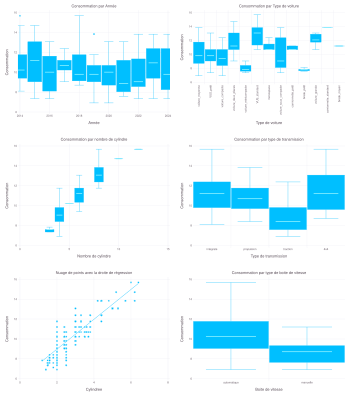

In [138]:
box_plot_categorical(filtered_train)

Le diagramme en boite des types de transmission semble indiquer que "intégrale" et "4x4" sont similaire.  
Après vérification, il s'avère que "intégrale" et "4x4" correspondent pratiquement à la même chose ce qui justifie la similarité entre les diagrammes en boite.  
Nous allons donc fusionner ces deux catégories.

In [139]:
filtered_train[filtered_train[:, :transmission] .== "integrale", :transmission] .= "integrale_4x4"
filtered_train[filtered_train[:, :transmission] .== "4x4", :transmission] .= "integrale_4x4"

22-element view(::PooledArrays.PooledVector{String15, UInt32, Vector{UInt32}}, [23, 69, 74, 76, 79, 83, 85, 91, 139, 140  …  175, 219, 250, 265, 283, 288, 303, 308, 330, 336]) with eltype String15:
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"
 "integrale_4x4"

In [140]:
filtered_train[filtered_train[:, :type] .== "voiture_sous_compacte", :type] .= "voiture_moyenne"
# filtered_train[filtered_train[:, :type] .== "voiture_compacte", :type] .= "VUS_petit"
filtered_train[filtered_train[:, :annee] .== 2023, :annee] .= 2024

36-element view(::Vector{Int64}, [1, 4, 48, 63, 67, 81, 85, 95, 130, 132  …  283, 290, 291, 301, 305, 308, 314, 317, 322, 347]) with eltype Int64:
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
    ⋮
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024
 2024

In [141]:
prepared_data_save = copy(filtered_train);

## Regression linéaire 

Le nuage de points sur la relation entre le nombre de cylindres et la consommation de carburant nous montre une relation linéaire.
Nous allons donc utiliser cette sous forme continue dans notre modèle de régression linéaire.

In [142]:
filtered_train[!,:nombre_cylindres] = Float64.(filtered_train[:, :nombre_cylindres]);

Les variables catégorielles sont encodées en variables numériques en utilisant la méthode **OneHotEncoder**.

In [143]:
function one_hot_encode(data, columns)
    for column in columns
        coerce!(data, column => Multiclass)
    end

    one_hot = machine(OneHotEncoder(), data)
    fit!(one_hot, verbosity=0)
    return MLJ.transform(one_hot, data)
end

one_hot_encode (generic function with 1 method)

In [144]:
categorical_cols = [:type, :transmission, :boite, :annee]

filtered_train = one_hot_encode(filtered_train, categorical_cols)

first(filtered_train, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,nombre_cylindres,cylindree,transmission__integrale_4x4,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle,consommation
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,4.4,1.0,0.0,0.0,1.0,0.0,13.8359
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,1.0,0.0,0.0,1.0,0.0,9.80042
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,3.3,0.0,1.0,0.0,1.0,0.0,11.7605
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,8.0,5.0,1.0,0.0,0.0,1.0,0.0,13.0672
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,4.4,1.0,0.0,0.0,1.0,0.0,13.8359


On utilise la méthode **StandardScaler** pour standardiser les données.

In [145]:
numeric_cols = [:nombre_cylindres, :cylindree, :consommation]

standardizer = machine(Standardizer(), filtered_train[:, numeric_cols])
fit!(standardizer, verbosity=0)
standard_train = copy(filtered_train)
standard_train[:, numeric_cols] = MLJ.transform(standardizer, filtered_train[:, numeric_cols])

first(standard_train, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,nombre_cylindres,cylindree,transmission__integrale_4x4,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle,consommation
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.70336,1.38355,1.0,0.0,0.0,1.0,0.0,1.87163
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.734989,-0.767443,1.0,0.0,0.0,1.0,0.0,-0.241384
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.484187,0.397677,0.0,1.0,0.0,1.0,0.0,0.784938
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.70336,1.9213,1.0,0.0,0.0,1.0,0.0,1.46915
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.70336,1.38355,1.0,0.0,0.0,1.0,0.0,1.87163


Creation du modèle de régression linéaire.

In [146]:
LinearRegressor = @load LinearRegressor pkg=MLJLinearModels
function create_linear_machine(X_train, y_train)
    linear_machine = machine(LinearRegressor(), X_train, y_train)
    fit!(linear_machine)
    return linear_machine
end

import MLJLinearModels ✔


[ Info: For silent loading, specify `verbosity=0`. 


create_linear_machine (generic function with 1 method)

Regression sur les données d'entrainement non standardisées.

In [147]:
X = select(filtered_train, Not(:consommation))
y = filtered_train[:, :consommation]          

train, valid = partition(eachindex(y), 0.8, shuffle=true) 
X_train, y_train = X[train, :], y[train]
X_valid, y_valid = X[valid, :], y[valid];

In [148]:
linear_model = create_linear_machine(X_train, y_train)

[ Info: Training machine(LinearRegressor(fit_intercept = true, …), …).
┌ Info: Solver: MLJLinearModels.Analytical
│   iterative: Bool false
└   max_inner: Int64 200


trained Machine; caches model-specific representations of data
  model: LinearRegressor(fit_intercept = true, …)
  args: 
    1:	Source @327 ⏎ Table{AbstractVector{Continuous}}
    2:	Source @938 ⏎ AbstractVector{Continuous}


ML utilise la cross validation pour évaluer le modèle.

In [149]:
evaluate!(linear_model; resampling=CV(), measure=rmse)

PerformanceEvaluation object with these fields:
  model, measure, operation,
  measurement, per_fold, per_observation,
  fitted_params_per_fold, report_per_fold,
  train_test_rows, resampling, repeats
Extract:
┌────────────────────────┬───────────┬─────────────┐
│ measure                │ operation │ measurement │
├────────────────────────┼───────────┼─────────────┤
│ RootMeanSquaredError() │ predict   │ 0.812       │
└────────────────────────┴───────────┴─────────────┘
┌────────────────────────────────────────────┬─────────┐
│ per_fold                                   │ 1.96*SE │
├────────────────────────────────────────────┼─────────┤
│ [0.942, 0.696, 0.719, 0.758, 0.881, 0.849] │ 0.0858  │
└────────────────────────────────────────────┴─────────┘


Calcule du RMSE sur l'ensemble de validation.

RMSE transmission séparé, outlier sur cylindré : 0.777308201329143 sur X_Valid et 0.888 avec evaluate
RMSE transmission séparé, outlier retirer sur cylindré : 0.5909247534690515 sur X_Valid et 0.883 avec evaluate

RMSE transmission fusionné, outlier retirer sur cylindré : 0.5981385897946929 sur X_Valid et 0.879 avec evaluate

RMSE transmission et type fusionné (voiture moyenne et voiture_sous_compacte), outlier retirer sur cylindré : 0.5828721422364939 sur X_Valid et 0.813 avec evaluate
RMSE transmission et type fusionné (voiture moyenne et voiture_sous_compacte), outlier retirer sur cylindré : 0.584010592269474 sur X_Valid et 0.812 avec evaluate

In [150]:
y_pred = collect(predict(linear_model, X_valid))
println("Linear model (not standardize) MSE: ", rms(y_pred, y_valid))

Linear model (not standardize) MSE: 0.584010592269474


### Regression sur les données d'entrainement standardisées.

In [ ]:
X = select(standard_train, Not(:consommation))
y = standard_train[:, :consommation]          

train, valid = partition(eachindex(y), 0.8, shuffle=true) 
X_train, y_train = X[train, :], y[train]
X_valid, _ = X[valid, :], y[valid]; # Keep the original y_valid in L/100km

In [ ]:
linear_model = create_linear_machine(X_train, y_train)

In [ ]:
evaluate!(linear_model; resampling=Holdout(), measure=rmse)

#### ! Le MSE de ici est sur les valeurs standardisées

In [ ]:
fit_result = standardizer.fitresult.fitresult_given_feature

y_pred_standardized = collect(predict(linear_model, X_valid))

y_pred = y_pred_standardized .* fit_result[:consommation][2] .+ fit_result[:consommation][1]

# Calculate and print the error
println("Linear model (standardized) MSE: ", rms(y_pred, y_valid))

first(y_pred, 5)


## Regression Ridge
### ref TD9

In [ ]:
X = select(standard_train, Not(:consommation))
y = standard_train[:, :consommation]          

train, valid = partition(eachindex(y), 0.8, shuffle=true) 
X_train, y_train = X[train, :], y[train]
X_valid, _ = X[valid, :], y[valid]; # Keep the original y_valid in L/100km

In [ ]:
# https://juliaai.github.io/DataScienceTutorials.jl/getting-started/fit-and-predict/
# https://juliaai.github.io/MLJ.jl/dev/

function ridge_reg(X, y, λ=1.0)
    ridge_model = @load RidgeRegressor pkg=MLJLinearModels verbosity=0
    ridge_m = ridge_model(lambda=λ) 
    ridge_machine = machine(ridge_m, X, y)
    fit!(ridge_machine, verbosity=0)

    return ridge_machine
end


### Optimisation Lambda

In [ ]:
fit_result = standardizer.fitresult.fitresult_given_feature

best_λ = 0.0
best_rmse = Inf

for λ in 2.0:0.1:20.0
    ridge_machine = ridge_reg(X_train, y_train, λ)

    y_pred_standardized = collect(predict(ridge_machine, X_valid))

    y_pred = y_pred_standardized .* fit_result[:consommation][2] .+ fit_result[:consommation][1]

    current_rmse =  rmse(y_valid, y_pred)

    if current_rmse < best_rmse
        best_rmse = current_rmse
        best_λ = λ
    end
end

println("Best λ: ", best_λ)
println("Best RMSE: ", best_rmse)


In [ ]:
ridge_machine = ridge_reg(X_train, y_train, best_λ)
evaluate!(ridge_machine; resampling=Holdout(), measure=rmse)

#### ! Le MSE de ici est sur les valeurs standardisées

ML Model stack  
voir https://juliaai.github.io/MLJ.jl/dev/model_stacking/


Chargement des models

In [ ]:
DecisionTreeRegressor = @load DecisionTreeRegressor pkg=DecisionTree verbosity=0
EvoTreeRegressor = @load EvoTreeRegressor pkg=EvoTrees verbosity=0
XGBoostRegressor = @load XGBoostRegressor pkg=XGBoost verbosity=0
KNNRegressor = @load KNNRegressor pkg=NearestNeighborModels verbosity=0
LinearRegressor = @load LinearRegressor pkg=MLJLinearModels verbosity=0;
GradientBoostingRegressor = @load GradientBoostingRegressor verbosity=0
BayesianRidgeRegressor = @load BayesianRidgeRegressor verbosity=0

Creation de la stack

In [ ]:
stack = Stack(;metalearner=LinearRegressor(), # comment les résultats des modèles sont combinés
                resampling=CV(), # Cross-validation
                measures=rmse,
                # constant=ConstantRegressor(), 
                # tree_2=DecisionTreeRegressor(max_depth=2),
                # tree_3=DecisionTreeRegressor(max_depth=3),
                lin=LinearRegressor(),
                evo=EvoTreeRegressor(),
                # knn=KNNRegressor(),
                # xgb=XGBoostRegressor(),
                gbr=GradientBoostingRegressor(),
                brr=BayesianRidgeRegressor(),
            )

ML gère les tests avec un ensemble de validation "circulaire"

In [ ]:
data = copy(prepared_data_save)
data[!,:nombre_cylindres] = Float64.(data[:, :nombre_cylindres]);
data = one_hot_encode(data, categorical_cols)
first(data, 5)

In [ ]:
X = select(data, Not(:consommation))
y = data[:, :consommation];

In [ ]:
stack_model = machine(stack, X, y)
fit!(stack_model, verbosity=0)

In [ ]:
evaluate!(stack_model; resampling=Holdout(), measure=rmse)

In [ ]:
report(stack_model).cv_report

In [ ]:
compatible_models = models(matching(X, y))

In [ ]:
model_names = [model.name for model in compatible_models]

evaluation_results = Dict()

for model_info in compatible_models
    model_name = model_info.name
    package_name = model_info.package_name
    
    try
        loaded_model = load(model_name, pkg=package_name, verbosity=0)
        
        mach = machine(loaded_model(), X, y)
        
        fit!(mach, verbosity=0)
        
        cv = CV()  
        metrics = evaluate!(mach, resampling=cv, measure=rmse).measurement
        println("Evaluation for $model_name: RMSE = $metrics")
        evaluation_results[model_name] = metrics  # You can store other metrics if needed
    catch e
        continue
    end
end

sorted_results = sort(evaluation_results, by = x -> x[2], rev = true)
println("\nSorted results by RMSE:")
for (model, rmse) in sorted_results
    println("$model: RMSE = $rmse")
end


In [ ]:
sorted_results = sort(evaluation_results, by = x -> x[2], rev = true)
println("\nSorted results by RMSE:")
for (model, rmse) in sorted_results
    println("$model: RMSE = $rmse")
end


# Création du fichier de prédictions

In [ ]:
test[!,:nombre_cylindres] = Float64.(test[:, :nombre_cylindres]);
X_test = one_hot_encode(test, categorical_cols);

first(X_test, 5)

In [ ]:
describe(prepared_data_save[:,:consommation])

In [ ]:
y_pred_stack = predict(stack_model, X_test)
describe(y_pred_stack)

In [ ]:
linear_model = create_linear_machine(X, y)

y_pred_linear = predict(linear_model, X_test)

describe(y_pred_linear)

In [ ]:
n = length(y_pred_stack)
id = 1:n

df_pred = DataFrame(id=id, consommation=y_pred_stack)

CSV.write("benchmark.csv", df_pred)